In [1]:
import numpy as np
import matplotlib.pyplot as plt
import cv2 
from moviepy.editor import VideoFileClip

In [2]:
input_video = "../data/race_car.mp4"

In [3]:
clip = VideoFileClip(input_video)
clip.ipython_display(width=600)


Moviepy - Building video __temp__.mp4.
MoviePy - Writing audio in __temp__TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video __temp__.mp4



Moviepy - Done !
Moviepy - video ready __temp__.mp4


shape:(720, 1280, 3)


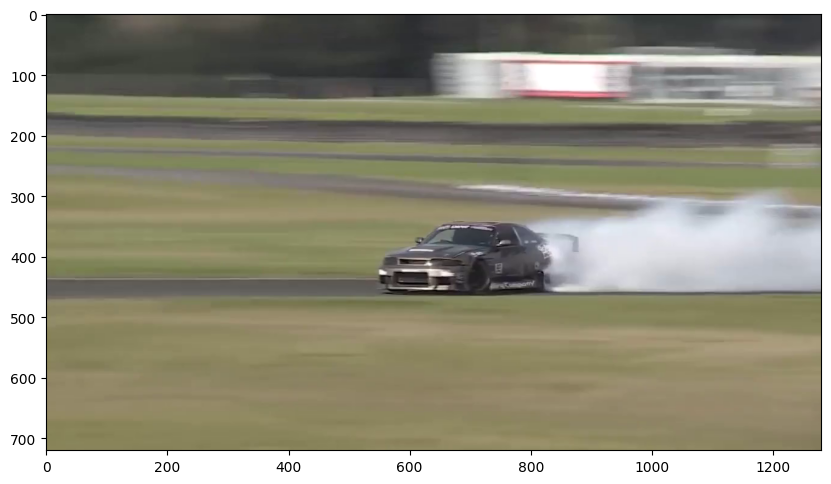

In [4]:
source = input_video

video_cap = cv2.VideoCapture(source)
if video_cap.isOpened() == False:
    print("Video Capture Failed")

# Read and display the first frame of the video
ret, frame = video_cap.read()
plt.figure(figsize=(10,8))
plt.imshow(frame[...,::-1]) # Elipsis '...' =  short cut for full slice
print(f"shape:{frame.shape}")


In [5]:
# Create video write object

# fourcc parameters 
frame_w = int(video_cap.get(cv2.CAP_PROP_FRAME_WIDTH))
frame_h = int(video_cap.get(cv2.CAP_PROP_FRAME_HEIGHT))
frame_fps = int(video_cap.get(cv2.CAP_PROP_FPS))

# fourcc values
fourcc_avi = cv2.VideoWriter_fourcc("M", "J", "P", "G")
fourcc_mp4 = cv2.VideoWriter_fourcc(*"XVID")

# Video output file names
file_out_avi = "../data/video_out.avi"
file_out_mp4 = "../data/video_out.mp4"

# Slow down video speed
frame_fps = int(frame_fps/3)

# Create video writer objects
out_avi = cv2.VideoWriter(file_out_avi, fourcc_avi, frame_fps, (frame_w, frame_h))
out_mp4 = cv2.VideoWriter(file_out_mp4, fourcc_mp4, frame_fps, (frame_w, frame_h))

In [6]:
def drawBannerText(frame, text, banner_height_percent=0.05, text_color= (0,255,0)):
    banner_height = int(banner_height_percent * frame.shape[0])
    cv2.rectangle(frame, (0,0), (frame.shape[1], banner_height), (0,0,0), thickness=-1)

    # Draw Text Banner
    left_offset = 20
    location = (left_offset, int(5 + (banner_height_percent * frame.shape[0])/2 ))
    fontScale = 1.5
    fontThickness = 2
    cv2.putText(frame, text, location, cv2.FONT_HERSHEY_PLAIN, fontScale, text_color, fontThickness, cv2.LINE_AA)


In [7]:
# Process Video Frames
frame_count = 0
while True:

    # Read one frame at a time
    ok, frame = video_cap.read()

    if not ok:
        break

    # increment the frame count for annotation
    frame_count += 1

    # Annotate each video frame
    drawBannerText(frame, f"Frame: {frame_count}, FPS: {frame_fps}")

    # Write the frame to the output files
    out_avi.write(frame)
    out_mp4.write(frame)


In [8]:
# Release teh VideoCapture objects
video_cap.release()
out_avi.release()
out_mp4.release()

In [9]:
# Load new video
clip = VideoFileClip(file_out_mp4)
clip.ipython_display(width=600)

Moviepy - Building video __temp__.mp4.
Moviepy - Writing video __temp__.mp4



Moviepy - Done !
Moviepy - video ready __temp__.mp4
